In [1]:
!pip install -r requirements.txt

## DownLoad Dataset

In [ ]:
import os
import requests
import zipfile

# Define the URLs for the files
dataset_url = "https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_Dataset.zip"
text_url = "https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_text.zip"

# Define the directory paths to save the files
dataset_dir = "Data/Flickr8k_Dataset"
text_dir = "Data/Flickr8k_text"

# Create directories if they don't exist
os.makedirs(dataset_dir, exist_ok=True)
os.makedirs(text_dir, exist_ok=True)

# Download and save the dataset file
dataset_zip_path = os.path.join(dataset_dir, "Flickr8k_Dataset.zip")
with open(dataset_zip_path, "wb") as f:
    response = requests.get(dataset_url)
    f.write(response.content)

# Extract the dataset zip file
with zipfile.ZipFile(dataset_zip_path, "r") as zip_ref:
    zip_ref.extractall(dataset_dir)

# Download and save the text file
text_zip_path = os.path.join(text_dir, "Flickr8k_text.zip")
with open(text_zip_path, "wb") as f:
    response = requests.get(text_url)
    f.write(response.content)

# Extract the text zip file
with zipfile.ZipFile(text_zip_path, "r") as zip_ref:
    zip_ref.extractall(text_dir)

print("Files downloaded and extracted successfully.")


## Note that this project used tensorflow and keras libraries for its execution

In [2]:
# Import the necessary Libraries

import pickle
from pickle import dump, load
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.models import Model, load_model
import numpy as np
import cv2
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.preprocessing.text import Tokenizer
from collections import Counter
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.layers import Input, Dense, LSTM, Embedding, Dropout, concatenate, add
from tensorflow.keras.preprocessing.sequence import pad_sequences
import pandas as pd
import os
import tensorflow as tf
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from textwrap import wrap
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
import random
from numpy import array

plt.rcParams['font.size'] = 12
sns.set_style("dark")
warnings.filterwarnings('ignore')


In [3]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))


Num GPUs Available:  0


In [4]:
# Set Parameters

path_to_image = "Data/Flickr8k_Dataset/Flicker8k_Dataset"
path_to_text = "Data/Flickr8k_text" 

image_tokens=pd.read_csv(path_to_text+"/Flickr8k.lemma.token.txt",sep='\t',names=["img_id","img_caption"])
train_image_names=pd.read_csv(path_to_text+"/Flickr_8k.trainImages.txt",names=["img_id"])
test_image_names=pd.read_csv(path_to_text+"/Flickr_8k.testImages.txt",names=["img_id"])
validation_image_names=pd.read_csv(path_to_text+"/Flickr_8k.devImages.txt",names=["img_id"])

# images dataset
images=os.listdir(path_to_image)

# Dataset Preview
print("Total number of pictures : ",len(images))
print("Images and captions dataset")
display(image_tokens.head())
print("Train imageset")
display(train_image_names.head())
print("Test imageset")
display(test_image_names.head())
print("Validation imageset")
display(validation_image_names.head())

Total number of pictures :  8091
Images and captions dataset


,img_id,img_caption
0,1305564994_00513f9a5b.jpg#0,A man in street racer armor be examine the tir...
1,1305564994_00513f9a5b.jpg#1,Two racer drive a white bike down a road .
2,1305564994_00513f9a5b.jpg#2,Two motorist be ride along on their vehicle th...
3,1305564994_00513f9a5b.jpg#3,Two person be in a small race car drive by a g...
4,1305564994_00513f9a5b.jpg#4,Two person in race uniform in a street car .


Train imageset


,img_id
0,2513260012_03d33305cf.jpg
1,2903617548_d3e38d7f88.jpg
2,3338291921_fe7ae0c8f8.jpg
3,488416045_1c6d903fe0.jpg
4,2644326817_8f45080b87.jpg


Test imageset


,img_id
0,3385593926_d3e9c21170.jpg
1,2677656448_6b7e7702af.jpg
2,311146855_0b65fdb169.jpg
3,1258913059_07c613f7ff.jpg
4,241347760_d44c8d3a01.jpg


Validation imageset


,img_id
0,2090545563_a4e66ec76b.jpg
1,3393035454_2d2370ffd4.jpg
2,3695064885_a6922f06b2.jpg
3,1679557684_50a206e4a9.jpg
4,3582685410_05315a15b8.jpg


In [6]:
#removing the #0,#1,#2,#3,#5 from the image ids and add a start and an end token to each caption
image_tokens["img_id"]=image_tokens["img_id"].map(lambda x: x[:len(x)-2])
image_tokens["img_caption"]=image_tokens["img_caption"].map(lambda x: "<start> " + x.strip() + " <end>")
#head of the image_tokens dataframe
image_tokens.head()

,img_id,img_caption
0,1305564994_00513f9a5b.jpg,<start> A man in street racer armor be examine...
1,1305564994_00513f9a5b.jpg,<start> Two racer drive a white bike down a ro...
2,1305564994_00513f9a5b.jpg,<start> Two motorist be ride along on their ve...
3,1305564994_00513f9a5b.jpg,<start> Two person be in a small race car driv...
4,1305564994_00513f9a5b.jpg,<start> Two person in race uniform in a street...


In [7]:
#creating train dictionary having key as the image id and value as a list of its captions
train_captions={}
for i in tqdm(range(len(train_image_names))):
  l=[caption for caption in(image_tokens[image_tokens["img_id"]==train_image_names["img_id"].iloc[i]].img_caption)]
  train_captions[train_image_names["img_id"].iloc[i]]=l

#creating test dictionary having key as the image id and value as a list of its captions
test_captions={}
for i in tqdm(range(len(test_image_names))):
  l=[caption for caption in(image_tokens[image_tokens["img_id"]==test_image_names["img_id"].iloc[i]].img_caption)]
  test_captions[test_image_names["img_id"].iloc[i]]=l
    

#creating validation dictionary having key as the image id and value as a list of its captions
validation_captions={}
for i in tqdm(range(len(validation_image_names))):
  l=[caption for caption in(image_tokens[image_tokens["img_id"]==validation_image_names["img_id"].iloc[i]].img_caption)]
  validation_captions[validation_image_names["img_id"].iloc[i]]=l
    


100%|█████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 563.04it/s]


ResNet50 serves as a feature extractor in our image captioning project pipeline that provideds rich representations of the input images that can be used by captioning model to generate descriptive captions.

![Medium Article](https://miro.medium.com/v2/resize:fit:1100/format:webp/1*VM94wVftxP7wkiKo4BjfLA.png)

- Input Layer:
    - Shape: (224, 224, 3)
    - This layer represents the input image data. Each image is expected to have a height of 224 pixels, a width of 224 pixels, and 3 color channels (RGB).

- Convolutional Layers (Convolutional Blocks):
    - The ResNet50 model consists of several convolutional blocks, each containing multiple convolutional layers. These layers are responsible for learning features from the input images.
    - The convolutional blocks in ResNet50 contain a combination of 3x3 convolutional layers, batch normalization layers, and ReLU activation functions.

- Identity Blocks:
    - In addition to the convolutional blocks, ResNet50 also includes identity blocks. These blocks help in maintaining the dimensions of the input data.
    - Each identity block typically consists of multiple convolutional layers with batch normalization and ReLU activation functions. The output of an identity block is added to the input of the block, creating a shortcut connection.

- Pooling Layers:
    - After some convolutional and identity blocks, the model includes pooling layers to reduce the spatial dimensions of the feature maps while retaining important information.
    - In the ResNet50 model, global average pooling (Pooling='avg') is used, which calculates the average value of each feature map.
    
- Fully Connected Layers (Dense Layers):
    - Following the pooling layers, ResNet50 includes a fully connected layer. This layer aggregates the features extracted by the convolutional layers and makes predictions based on these features.
    - In the ResNet50 model, the pooling layer acts as the final layer, performing global average pooling. Therefore, there are no additional fully connected layers in the ResNet50 model.

- Output Layer:
    - The output layer of the ResNet50 model depends on the task for which the model is being used (classification, object detection, etc.).
    - In some cases, additional layers (such as softmax or sigmoid activation functions) may be added to the output layer to produce the final predictions.

In [8]:
model=ResNet50(include_top=False, weights='imagenet',pooling='avg',input_shape=(224,224,3))
model.summary()

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)      │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_pad (ZeroPadding2D)     │ (None, 230, 230, 3)       │               0 │ input_layer[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_conv (Conv2D)           │ (None, 112, 112, 64)      │           9,472 │ conv1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_bn (BatchNormalization) │ (None, 112, 112, 64)      │             256 │ conv1_conv[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_relu (Activation)       │ (None, 112, 112, 64)      │               0 │ conv1_bn[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pad (ZeroPadding2D)     │ (None, 114, 114, 64)      │               0 │ conv1_relu[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pool (MaxPooling2D)     │ (None, 56, 56, 64)        │               0 │ pool1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_conv (Conv2D)  │ (None, 56, 56, 64)        │           4,160 │ pool1_pool[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_bn             │ (None, 56, 56, 64)        │             256 │ conv2_block1_1_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_relu           │ (None, 56, 56, 64)        │               0 │ conv2_block1_1_bn[0][0]    │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_conv (Conv2D)  │ (None, 56, 56, 64)        │          36,928 │ conv2_block1_1_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_bn             │ (None, 56, 56, 64)        │             256 │ conv2_block1_2_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_relu           │ (None, 56, 56, 64)        │               0 │ conv2_block1_2_bn[0][0]    │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_0_conv (Conv2D)  │ (None, 56, 56, 256)       │          16,640 │ pool1_pool[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_3_conv (Conv2D)  │ (None, 56, 56, 256)       │          16,640 │ conv2_block1_2_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼───────────────

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [9]:
os.makedirs("Features/", exist_ok=True)

## Extract image features from resnet50 and save it to be loaded 

In [10]:
#extracting image encodings(features) from resnet50 and forming dict train_features
train_features={}
c=0
if not os.path.exists("Features/train_encoded_images.p"):
    for image_name in tqdm(train_captions):
      img_path=path_to_image+"/"+image_name
      img=image.load_img(img_path,target_size=(224,224))
      x = image.img_to_array(img)
      x = np.expand_dims(x, axis=0)
      x = preprocess_input(x)
      features = model.predict(x)
      train_features[image_name]=features.squeeze()

    with open("Features/train_encoded_images.p", "wb" ) as pickle_f:
        pickle.dump(train_features, pickle_f )
else:
    # Load the file
    with open("Features/train_encoded_images.p", "rb") as f:
        train_features = pickle.load(f)
    print("File loaded successfully!")

File loaded successfully!


In [11]:
#extracting image encodings(features) from resnet50 and forming dict test_features
test_features={}
c=0
if not os.path.exists("Features/test_encoded_images.p"):
    for image_name in tqdm(test_captions):
      img_path=path_to_image+"/"+image_name
      img=image.load_img(img_path,target_size=(224,224))
      x = image.img_to_array(img)
      x = np.expand_dims(x, axis=0)
      x = preprocess_input(x)
      features = model.predict(x)
      test_features[image_name]=features.squeeze()
    with open("Features/test_encoded_images.p", "wb" ) as pickle_f:
        pickle.dump(test_features, pickle_f )
else:
    # Load the file
    with open("Features/test_encoded_images.p", "rb") as f:
        test_features = pickle.load(f)
    print("File loaded successfully!")


File loaded successfully!


In [12]:
#extracting image encodings(features) from resnet50 and forming dict validation_features
validation_features={}
c=0
if not os.path.exists("Features/validation_encoded_images.p"):
    for image_name in tqdm(validation_captions):
      img_path=path_to_image+"/"+image_name
      img=image.load_img(img_path,target_size=(224,224))
      x = image.img_to_array(img)
      x = np.expand_dims(x, axis=0)
      x = preprocess_input(x)
      features = model.predict(x)
      validation_features[image_name]=features.squeeze()
    with open("Features/validation_encoded_images.p", "wb" ) as pickle_f:
        pickle.dump(validation_features, pickle_f )
else:
    # Load the file
    with open("Features/validation_encoded_images.p", "rb") as f:
        validation_features = pickle.load(f)
    print("File loaded successfully!")
    

File loaded successfully!


In [13]:
all_captions=[]
for img_id in tqdm(train_captions):
  for captions in train_captions[img_id]:
    all_captions.append(captions)

for img_id in tqdm(test_captions):
  for captions in test_captions[img_id]:
    all_captions.append(captions)

for img_id in tqdm(validation_captions):
  for captions in validation_captions[img_id]:
    all_captions.append(captions)

all_words=" ".join(all_captions)
print()
print("All words: ", len(all_words))
unique_words=list(set(all_words.strip().split(" ")))
print("Unique words: " ,len(unique_words))

100%|██████████████████████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 984809.58it/s]


All words:  2659273
Unique words:  7292


## Forming dictionary of encoded captions

For each image ID in the training set (train_captions), the captions are tokenized into words, and each word is replaced with its corresponding index from the words_to_indices dictionary. 

In [14]:
#defining max_length and vocabulary size
vocab_size=len(unique_words)+1
max_length=15

In [15]:
#forming dictionaries containg mapping of words to indices and indices to words
words_to_indices={val:index+1 for index, val in enumerate(unique_words)}
indices_to_words = { index+1:val for index, val in enumerate(unique_words)}
words_to_indices["Unk"]=0
indices_to_words[0]="Unk"

In [16]:
#forming dictionary having encoded captions
train_encoded_captions={}
for img_id in tqdm(train_captions):
  train_encoded_captions[img_id]=[]
  for i in range(5):
    train_encoded_captions[img_id].append([words_to_indices[s] for s in train_captions[img_id][i].split(" ")])

100%|██████████████████████████████████████████████████████████████████████████| 6000/6000 [00:00<00:00, 107481.95it/s]


In [17]:
test_encoded_captions={}
for img_id in tqdm(test_captions):
  test_encoded_captions[img_id]=[]
  for i in range(5):
    test_encoded_captions[img_id].append([words_to_indices[s] for s in test_captions[img_id][i].split(" ")])

100%|████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 5916.11it/s]


In [18]:
validation_encoded_captions={}
for img_id in tqdm(validation_captions):
  validation_encoded_captions[img_id]=[]
  for i in range(5):
    validation_encoded_captions[img_id].append([words_to_indices[s] for s in validation_captions[img_id][i].split(" ")])

100%|███████████████████████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 88820.97it/s]


In [19]:
for img_id in tqdm(train_encoded_captions):
  print(train_encoded_captions[img_id])
  break

  0%|                                                                                         | 0/6000 [00:00<?, ?it/s]

[[2938, 5272, 2656, 7004, 6102, 304, 1044, 6708, 588, 7004, 4156, 6028, 6710, 363, 1134], [2938, 3047, 7004, 6520, 6931, 7004, 6454, 6710, 1134], [2938, 4359, 7004, 6520, 3364, 3648, 1875, 6028, 660, 5266, 363, 1134], [2938, 4359, 7004, 7137, 5916, 4156, 6028, 6710, 363, 1134], [2938, 4359, 7004, 304, 6454, 6708, 6037, 2249, 5685, 2668, 6511, 363, 1134]]


In [20]:
for img_id in tqdm(train_encoded_captions):
  train_encoded_captions[img_id]=pad_sequences(train_encoded_captions[img_id], maxlen=max_length, padding='post')

for img_id in tqdm(test_encoded_captions):
  test_encoded_captions[img_id]=pad_sequences(test_encoded_captions[img_id], maxlen=max_length, padding='post')

for img_id in tqdm(validation_encoded_captions):
  validation_encoded_captions[img_id]=pad_sequences(validation_encoded_captions[img_id], maxlen=max_length, padding='post')

100%|███████████████████████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 68536.62it/s]


In [21]:
for img_id in tqdm(train_encoded_captions):
  print(train_encoded_captions[img_id])
  break

  0%|                                                                                         | 0/6000 [00:00<?, ?it/s]

[[2938 5272 2656 7004 6102  304 1044 6708  588 7004 4156 6028 6710  363
  1134]
 [2938 3047 7004 6520 6931 7004 6454 6710 1134    0    0    0    0    0
     0]
 [2938 4359 7004 6520 3364 3648 1875 6028  660 5266  363 1134    0    0
     0]
 [2938 4359 7004 7137 5916 4156 6028 6710  363 1134    0    0    0    0
     0]
 [2938 4359 7004  304 6454 6708 6037 2249 5685 2668 6511  363 1134    0
     0]]


## Preview encoded captions

In [22]:
for x in train_encoded_captions['2513260012_03d33305cf.jpg'][2]:
  print(indices_to_words[x])

<start>
Two
dog
chase
each
other
across
the
snowy
ground
.
<end>
Unk
Unk
Unk


In [23]:
train_encoded_captions["2513260012_03d33305cf.jpg"][0][0:1].tolist()

[2938]

## Define data_generator to be use for fit_generator

In [24]:
def data_generator(train_encoded_captions,train_features,batch_size):
  X1, X2, Y = list(), list(), list()
  max_length=15
  n=0
  for img_id in train_encoded_captions:
    n+=1
    for i in range(5):
      for j in range(1,15):
        curr_sequence=train_encoded_captions[img_id][i][0:j].tolist()
        next_word=train_encoded_captions[img_id][i][j]
        curr_sequence=pad_sequences([curr_sequence], maxlen=max_length, padding='post')[0]
        one_hot_next_word=to_categorical([next_word],vocab_size)[0]
        X1.append(train_features[img_id])
        X2.append(curr_sequence)
        Y.append(one_hot_next_word)
    if(n==batch_size):
      yield ((array(X1), array(X2)), array(Y))
      X1, X2, Y = list(), list(), list()
      n=0

Check input size

In [25]:
for i in train_features:
  print(train_features[i].shape)
  break

(2048,)


In [26]:
#model
input_1=Input(shape=(2048,))
dropout_1=Dropout(0.2)(input_1)
dense_1=Dense(256,activation='relu')(dropout_1)

input_2=Input(shape=(max_length,))
embedding_1=Embedding(vocab_size,256)(input_2)
dropout_2=Dropout(0.2)(embedding_1)
lstm_1=LSTM(256)(dropout_2)

add_1=add([dense_1,lstm_1])
dense_2=Dense(256,activation='relu')(add_1)
dense_3=Dense(vocab_size,activation='softmax')(dense_2)

model=Model(inputs=[input_1,input_2],outputs=dense_3)
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)    │ (None, 15)                │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ input_layer_1 (InputLayer)    │ (None, 2048)              │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ embedding (Embedding)         │ (None, 15, 256)           │       1,867,008 │ input_layer_2[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout (Dropout)             │ (None, 2048)              │               0 │ input_layer_1[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_1 (Dropout)           │ (None, 15, 256)           │               0 │ embedding[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense (Dense)                 │ (None, 256)               │         524,544 │ dropout[0][0]              │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ lstm (LSTM)                   │ (None, 256)               │         525,312 │ dropout_1[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ add (Add)                     │ (None, 256)               │               0 │ dense[0][0], lstm[0][0]    │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_1 (Dense)               │ (None, 256)               │          65,792 │ add[0][0]                  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_2 (Dense)               │ (None, 7293)              │       1,874,301 │ dense_1[0][0]              │
└───────────────────────────────┴───────────────────────────┴─────────────────┴────────────────────────────┘

 Total params: 4,856,957 (18.53 MB)

 Trainable params: 4,856,957 (18.53 MB)

 Non-trainable params: 0 (0.00 B)

In [27]:
model.compile(loss='categorical_crossentropy', optimizer='adam',metrics=['accuracy'])

In [28]:
len(train_encoded_captions)

6000

In [29]:
import keras
early_stopping = keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True)

In [30]:
import keras
# Record the results
train_loss_values = []
train_accuracy_values = []
val_loss_values = []
val_accuracy_values = []

class MetricTracker(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        train_loss_values.append(logs.get('loss'))
        train_accuracy_values.append(logs.get('accuracy'))  # Use 'accuracy' instead of 'acc'
        val_loss_values.append(logs.get('val_loss'))
        val_accuracy_values.append(logs.get('val_accuracy'))  # Use 'val_accuracy' instead of 'val_acc'


In [31]:
epochs=12
no_of_photos=10
steps=len(train_encoded_captions)//no_of_photos
for i in range(epochs):
    generator=data_generator(train_encoded_captions,train_features,no_of_photos)
    valid_dataset=data_generator(validation_encoded_captions,validation_features,no_of_photos)
    model.fit(generator,epochs=1,steps_per_epoch=steps,validation_data=valid_dataset,verbose=1,callbacks=[early_stopping, MetricTracker()])
    model.save(f"models/CNN_LSTM_e{i}.h5")
model.save(f"models/CNN_LSTM.h5")

600/600 ━━━━━━━━━━━━━━━━━━━━ 100s 163ms/step - accuracy: 0.3303 - loss: 4.1029 - val_accuracy: 0.4719 - val_loss: 2.8604


600/600 ━━━━━━━━━━━━━━━━━━━━ 97s 161ms/step - accuracy: 0.4825 - loss: 2.6808 - val_accuracy: 0.4934 - val_loss: 2.6929


600/600 ━━━━━━━━━━━━━━━━━━━━ 98s 163ms/step - accuracy: 0.5063 - loss: 2.4031 - val_accuracy: 0.5034 - val_loss: 2.6367


600/600 ━━━━━━━━━━━━━━━━━━━━ 100s 166ms/step - accuracy: 0.5197 - loss: 2.2207 - val_accuracy: 0.5085 - val_loss: 2.6229


600/600 ━━━━━━━━━━━━━━━━━━━━ 99s 165ms/step - accuracy: 0.5320 - loss: 2.0768 - val_accuracy: 0.5084 - val_loss: 2.6548


600/600 ━━━━━━━━━━━━━━━━━━━━ 99s 164ms/step - accuracy: 0.5427 - loss: 1.9681 - val_accuracy: 0.5066 - val_loss: 2.7337


600/600 ━━━━━━━━━━━━━━━━━━━━ 99s 165ms/step - accuracy: 0.5535 - loss: 1.8845 - val_accuracy: 0.5042 - val_loss: 2.8205


600/600 ━━━━━━━━━━━━━━━━━━━━ 99s 165ms/step - accuracy: 0.5610 - loss: 1.8187 - val_accuracy: 0.5057 - val_loss: 2.8753


600/600 ━━━━━━━━━━━━━━━━━━━━ 100s 166ms/step - accuracy: 0.5700 - loss: 1.7585 - val_accuracy: 0.5080 - val_loss: 2.8942


600/600 ━━━━━━━━━━━━━━━━━━━━ 105s 176ms/step - accuracy: 0.5779 - loss: 1.7046 - val_accuracy: 0.5103 - val_loss: 2.9045


600/600 ━━━━━━━━━━━━━━━━━━━━ 103s 172ms/step - accuracy: 0.5852 - loss: 1.6603 - val_accuracy: 0.5080 - val_loss: 2.9353


600/600 ━━━━━━━━━━━━━━━━━━━━ 101s 168ms/step - accuracy: 0.5904 - loss: 1.6204 - val_accuracy: 0.5094 - val_loss: 2.9775


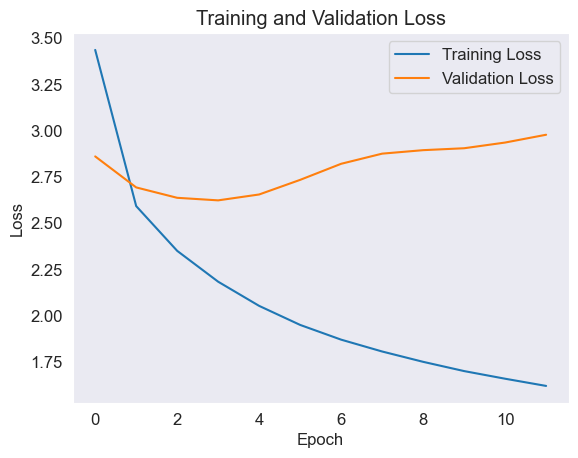

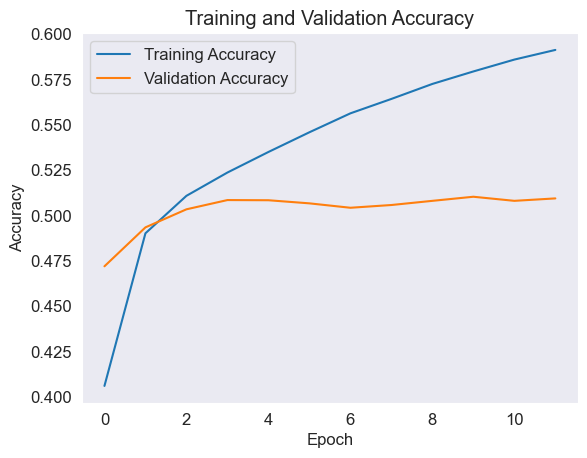

In [32]:
# Plot training and validation loss
plt.plot(train_loss_values, label='Training Loss')
plt.plot(val_loss_values, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot training and validation accuracy
plt.plot(train_accuracy_values, label='Training Accuracy')
plt.plot(val_accuracy_values, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [33]:
bestepoch=-1
bestacc=-1
for i in range(len(val_accuracy_values)):
    print(f'epoch:{i} loss: {val_loss_values[i]} accuracy: {val_accuracy_values[i]}')
    if val_accuracy_values[i]>bestacc:
        bestacc=val_accuracy_values[i]
        bestepoch=i
print(f'Best epoch is {bestepoch}')

epoch:0 loss: 2.8603668212890625 accuracy: 0.47194287180900574
epoch:1 loss: 2.6928627490997314 accuracy: 0.4934000074863434
epoch:2 loss: 2.6367270946502686 accuracy: 0.5033571720123291
epoch:3 loss: 2.6229355335235596 accuracy: 0.5084571242332458
epoch:4 loss: 2.6547536849975586 accuracy: 0.5083571672439575
epoch:5 loss: 2.733719825744629 accuracy: 0.5066428780555725
epoch:6 loss: 2.820538282394409 accuracy: 0.5042142868041992
epoch:7 loss: 2.8753244876861572 accuracy: 0.505728542804718
epoch:8 loss: 2.8941543102264404 accuracy: 0.5080285668373108
epoch:9 loss: 2.904517889022827 accuracy: 0.5102857351303101
epoch:10 loss: 2.9352948665618896 accuracy: 0.5080285668373108
epoch:11 loss: 2.9774622917175293 accuracy: 0.5093713998794556
Best epoch is 9


In [35]:
model = load_model(f"models/CNN_LSTM_e{bestepoch}.h5")
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)    │ (None, 15)                │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ input_layer_1 (InputLayer)    │ (None, 2048)              │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ embedding (Embedding)         │ (None, 15, 256)           │       1,867,008 │ input_layer_2[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout (Dropout)             │ (None, 2048)              │               0 │ input_layer_1[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_1 (Dropout)           │ (None, 15, 256)           │               0 │ embedding[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense (Dense)                 │ (None, 256)               │         524,544 │ dropout[0][0]              │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ lstm (LSTM)                   │ (None, 256)               │         525,312 │ dropout_1[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ add (Add)                     │ (None, 256)               │               0 │ dense[0][0], lstm[0][0]    │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_1 (Dense)               │ (None, 256)               │          65,792 │ add[0][0]                  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_2 (Dense)               │ (None, 7293)              │       1,874,301 │ dense_1[0][0]              │
└───────────────────────────────┴───────────────────────────┴─────────────────┴────────────────────────────┘

 Total params: 4,856,959 (18.53 MB)

 Trainable params: 4,856,957 (18.53 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

## Testing the models

## Greedy search

This greedy_search function is then used within a loop to generate predicted captions for a set of test images, and the generated captions are evaluated using the BLEU score against the reference captions.

BLEU score is a widely used metric for machine translation tasks, where the goal is to automatically translate text from one language to another. It was proposed as a way to assess the quality of machine-generated translations by comparing them to a set of reference translations provided by human translators.

Source : https://medium.com/@sthanikamsanthosh1994/understanding-bleu-and-rouge-score-for-nlp-evaluation-1ab334ecadcb

In [36]:
from nltk.translate.bleu_score import sentence_bleu

def greedy_search(photo):
    photo=photo.reshape(1,2048)
    in_text='<start>'
    for i in range(max_length):
        sequence = [words_to_indices[s] for s in in_text.split(" ") if s in words_to_indices]
        sequence = pad_sequences([sequence], maxlen=max_length, padding='post')
        y_pred = model.predict([photo,sequence],verbose=0)
        y_pred = np.argmax(y_pred[0])
        word = indices_to_words[y_pred]
        in_text += ' ' + word
        if word == '<end>':
            break
    final = in_text.split()
    final = final[1:-1]
    #final = " ".join(final)
    return final

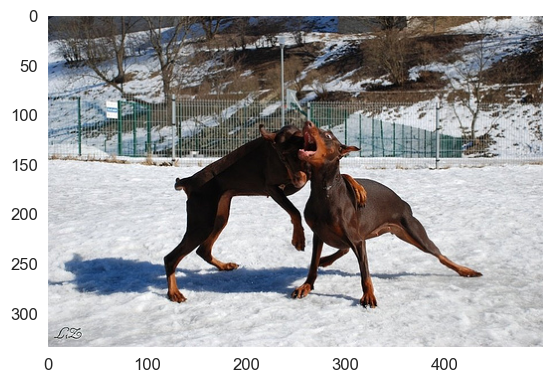

Referance Captions: 
Dog be in the snow in front of a fence .
Dog play on the snow .
Two brown dog playful fight in the snow .
Two brown dog wrestle in the snow .
Two dog play in the snow .

Predicted Caption: 
A dog play in the snow .

bleu score:  0.8091067115702212


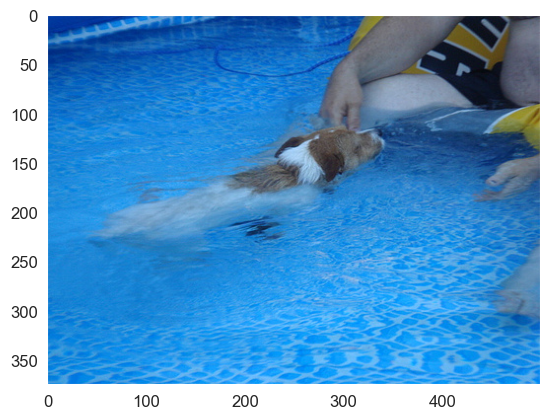

Referance Captions: 
a brown and white dog swim towards some in a pool
A dog in a swim pool swim toward sombody we cannot see .
A dog swim in a pool near a person .
Small dog be paddle through the water in a pool .
A small brown and white dog be in a pool .

Predicted Caption: 
A boy be jump into the air .

bleu score:  1.1931009847695213e-231


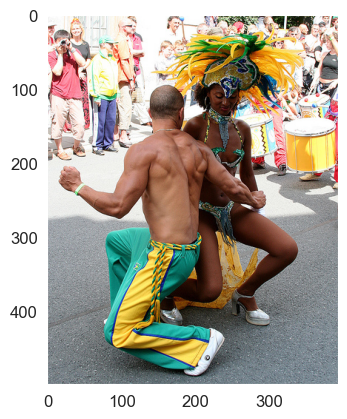

Referance Captions: 
A man and a woman in festive costume dance .
A man and a woman with feather on her head dance .
A man and a woman wear decorative costume and dance in a crowd of onlooker .
one performer wear a feathered headdress dance with another performer in street
Two person be dance with drum on the right and a crowd behind them .

Predicted Caption: 
A boy in a blue shirt play a game .

bleu score:  7.241926111174567e-155


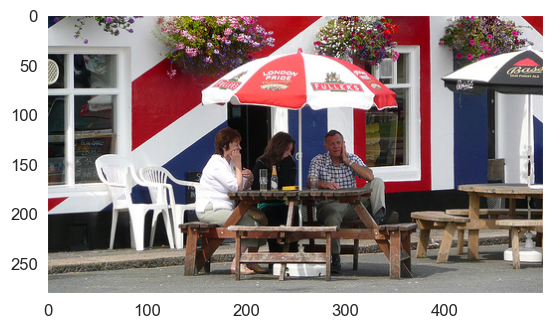

Referance Captions: 
A couple of person sit outdoors at a table with an umbrella and talk .
Three person be sit at an outside picnic bench with an umbrella .
Three person sit at an outdoor cafe .
Three person sit at an outdoor table in front of a building paint like the Union Jack .
Three person sit at a picnic table outside of a building paint like a union jack .

Predicted Caption: 
A man be jump over a ledge with a man watch .

bleu score:  1.4094822719577305e-231


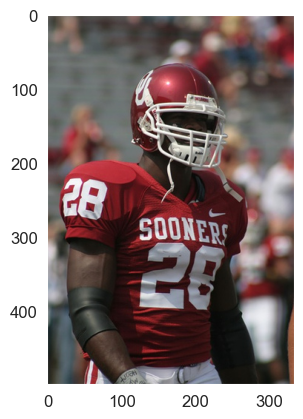

Referance Captions: 
A man be wear a Sooner red football shirt and helmet .
A Oklahoma Sooner football player wear his jersey number 28 .
A Sooner football player weas the number 28 and black armband .
Guy in red and white football uniform
The American footballer be wear a red and white strip .

Predicted Caption: 
Quarterback in white uniform be play football .

bleu score:  1.6954057018456463e-231


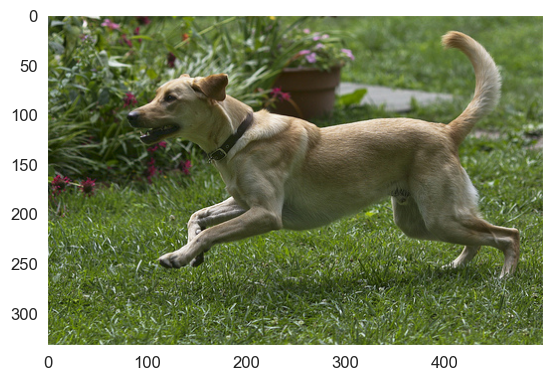

Referance Captions: 
A brown dog run
A brown dog run over grass .
A brown dog with its front paw off the ground on a grassy surface near red and purple flower .
A dog run across a grassy lawn near some flower .
A yellow dog be play in a grassy area near flower .

Predicted Caption: 
A dog be run on a grassy field .

bleu score:  6.130783336563573e-78


In [37]:
i=0
n=6
for img_id in test_features:
    i+=1
    img=cv2.imread(path_to_image+"/"+ img_id)
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    photo=test_features[img_id]
    plt.show()
    reference=[]
    for caps in test_captions[img_id]:
        list_caps=caps.split(" ")
        list_caps=list_caps[1:-1]
        reference.append(list_caps)
    candidate=greedy_search(photo)
    score = sentence_bleu(reference, candidate)
    print("Referance Captions: ")
    for cap in reference:
        print(" ".join(cap))
    print("\nPredicted Caption: ")
    print(" ".join(candidate))
    print("\nbleu score: ",score)
    if(i==n):
        break

In [38]:
i=0
tot_score=0
for img_id in tqdm(test_features):
    i+=1
    photo=test_features[img_id]
    reference=[]
    for caps in test_captions[img_id]:
        list_caps=caps.split(" ")
        list_caps=list_caps[1:-1]
        reference.append(list_caps)
    candidate=greedy_search(photo)
    score = sentence_bleu(reference, candidate)
    tot_score+=score
avg_score=tot_score/i
print()
print("Bleu score on Greedy search")
print("Score: ",avg_score)

100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [09:19<00:00,  1.79it/s]


Bleu score on Greedy search
Score:  0.09493003988677283


## Beam Search: Trading Speed for Accuracy
Beam Search takes a more comprehensive approach. At each time step, it keeps track of the top ‘k’ probable sequences, called ‘beams.’ The sequences are then extended by one more word, and only the top ‘k’ sequences are retained. This process is repeated until an end token is encountered, or the maximum length is reached.

Source : https://medium.com/@nikhilnan/greed-search-vs-beam-search-in-image-caption-generation-a-comparative-analysis-2a9d14755edb

Use Beam Search k=3

In [39]:
def beam_search(photo,k):
    photo=photo.reshape(1,2048)
    in_text='<start>'
    sequence = [words_to_indices[s] for s in in_text.split(" ") if s in words_to_indices]
    sequence = pad_sequences([sequence], maxlen=max_length, padding='post')
    y_pred = model.predict([photo,sequence],verbose=0)
    predicted=[]
    y_pred=y_pred.reshape(-1)
    for i in range(y_pred.shape[0]):
        predicted.append((i,y_pred[i]))
    predicted=sorted(predicted,key=lambda x:x[1])[::-1]
    b_search=[]
    for i in range(k):
        word = indices_to_words[predicted[i][0]]
        b_search.append((in_text +' ' + word,predicted[i][1]))
    
    for idx in range(max_length):
        b_search_square=[]
        for text in b_search:
            if text[0].split(" ")[-1]=="<end>":
                break
            sequence = [words_to_indices[s] for s in text[0].split(" ") if s in words_to_indices]
            sequence = pad_sequences([sequence], maxlen=max_length, padding='post')
            y_pred = model.predict([photo,sequence],verbose=0)
            predicted=[]
            y_pred=y_pred.reshape(-1)
            for i in range(y_pred.shape[0]):
                predicted.append((i,y_pred[i]))
            predicted=sorted(predicted,key=lambda x:x[1])[::-1]
            for i in range(k):
                word = indices_to_words[predicted[i][0]]
                b_search_square.append((text[0] +' ' + word,predicted[i][1]*text[1]))
        if(len(b_search_square)>0):
            b_search=(sorted(b_search_square,key=lambda x:x[1])[::-1])[:5]
    final=b_search[0][0].split()
    final = final[1:-1]
    #final=" ".join(final)
    return final

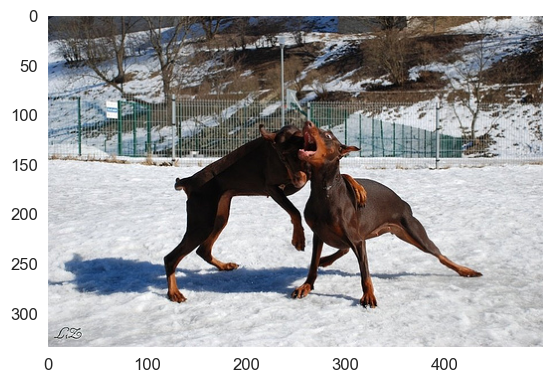

Referance Captions: 
Dog be in the snow in front of a fence .
Dog play on the snow .
Two brown dog playful fight in the snow .
Two brown dog wrestle in the snow .
Two dog play in the snow .
Predicted Caption: 
Two dog play in the snow .
bleu score:  1.0


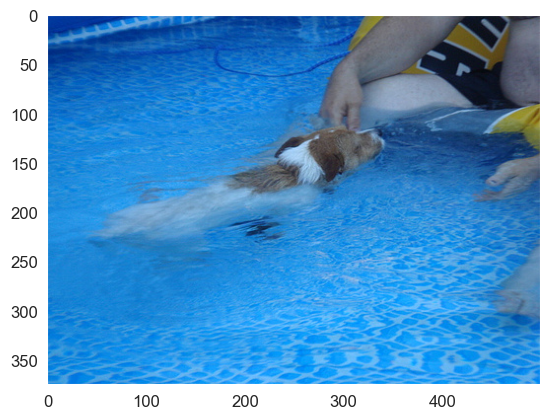

Referance Captions: 
a brown and white dog swim towards some in a pool
A dog in a swim pool swim toward sombody we cannot see .
A dog swim in a pool near a person .
Small dog be paddle through the water in a pool .
A small brown and white dog be in a pool .
Predicted Caption: 
A boy be jump into a swim pool .
bleu score:  4.751072498959554e-78


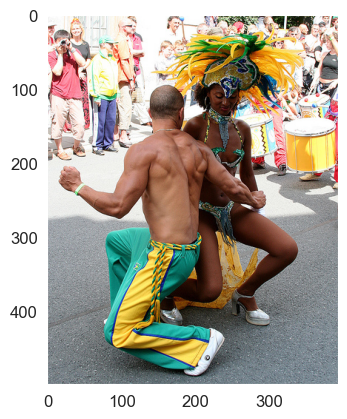

Referance Captions: 
A man and a woman in festive costume dance .
A man and a woman with feather on her head dance .
A man and a woman wear decorative costume and dance in a crowd of onlooker .
one performer wear a feathered headdress dance with another performer in street
Two person be dance with drum on the right and a crowd behind them .
Predicted Caption: 
A young boy play with a picture .
bleu score:  1.1931009847695213e-231


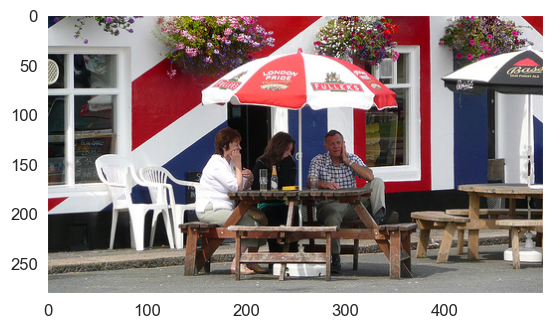

Referance Captions: 
A couple of person sit outdoors at a table with an umbrella and talk .
Three person be sit at an outside picnic bench with an umbrella .
Three person sit at an outdoor cafe .
Three person sit at an outdoor table in front of a building paint like the Union Jack .
Three person sit at a picnic table outside of a building paint like a union jack .
Predicted Caption: 
A man be sit on a ledge in front of a building .
bleu score:  0.3636227046500071


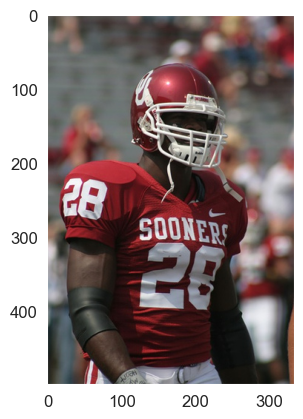

Referance Captions: 
A man be wear a Sooner red football shirt and helmet .
A Oklahoma Sooner football player wear his jersey number 28 .
A Sooner football player weas the number 28 and black armband .
Guy in red and white football uniform
The American footballer be wear a red and white strip .
Predicted Caption: 
A football player in a football uniform .
bleu score:  1.0547686614863434e-154


In [40]:
i=0
for img_id in test_features:
    i+=1
    img=cv2.imread(path_to_image+ "/" + img_id)
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    photo=test_features[img_id]
    plt.show()
    reference=[]
    for caps in test_captions[img_id]:
        list_caps=caps.split(" ")
        list_caps=list_caps[1:-1]
        reference.append(list_caps)
    candidate=beam_search(photo,3)
    score = sentence_bleu(reference, candidate)
    print("Referance Captions: ")
    for cap in reference:
        print(" ".join(cap))
    print("Predicted Caption: ")
    print(" ".join(candidate))
    print("bleu score: ",score)
    if(i==5):
        break

In [41]:
i=0
tot_score=0
for img_id in tqdm(test_features):
    i+=1
    photo=test_features[img_id]
    reference=[]
    for caps in test_captions[img_id]:
        list_caps=caps.split(" ")
        list_caps=list_caps[1:-1]
        reference.append(list_caps)
    candidate=beam_search(photo,3)
    score = sentence_bleu(reference, candidate)
    tot_score+=score
avg_score=tot_score/i
print()
print("Bleu score on Beam search with k=3")
print("Score: ",avg_score)

100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [39:18<00:00,  2.36s/it]


Bleu score on Beam search with k=3
Score:  0.10876140556326813


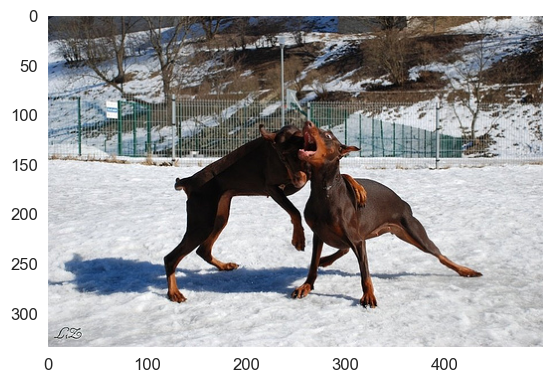

Referance Captions: 
Dog be in the snow in front of a fence .
Dog play on the snow .
Two brown dog playful fight in the snow .
Two brown dog wrestle in the snow .
Two dog play in the snow .

Predicted Caption: 
A dog play in the snow .

bleu score:  0.8091067115702212


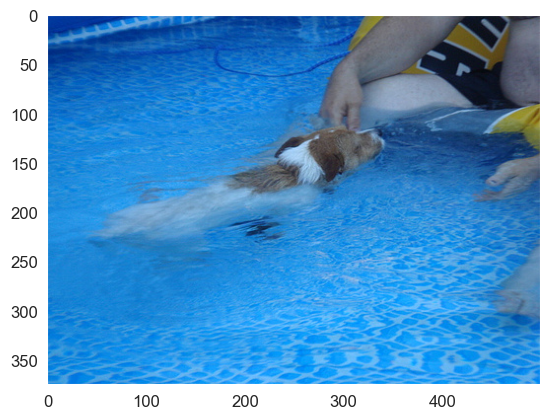

Referance Captions: 
a brown and white dog swim towards some in a pool
A dog in a swim pool swim toward sombody we cannot see .
A dog swim in a pool near a person .
Small dog be paddle through the water in a pool .
A small brown and white dog be in a pool .

Predicted Caption: 
A boy be jump into the air .

bleu score:  1.1931009847695213e-231


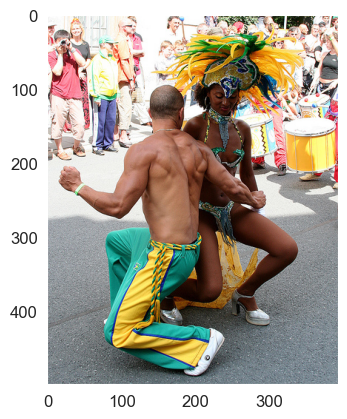

Referance Captions: 
A man and a woman in festive costume dance .
A man and a woman with feather on her head dance .
A man and a woman wear decorative costume and dance in a crowd of onlooker .
one performer wear a feathered headdress dance with another performer in street
Two person be dance with drum on the right and a crowd behind them .

Predicted Caption: 
A boy in a blue shirt play a game .

bleu score:  7.241926111174567e-155


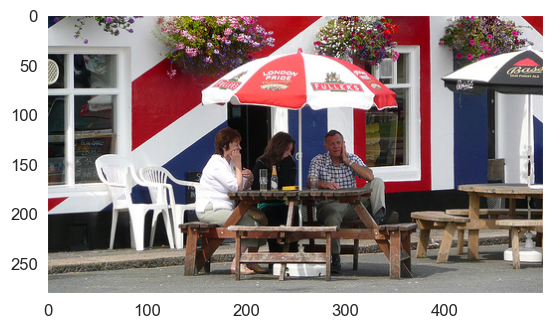

Referance Captions: 
A couple of person sit outdoors at a table with an umbrella and talk .
Three person be sit at an outside picnic bench with an umbrella .
Three person sit at an outdoor cafe .
Three person sit at an outdoor table in front of a building paint like the Union Jack .
Three person sit at a picnic table outside of a building paint like a union jack .

Predicted Caption: 
A man be jump over a ledge with a man watch .

bleu score:  1.4094822719577305e-231


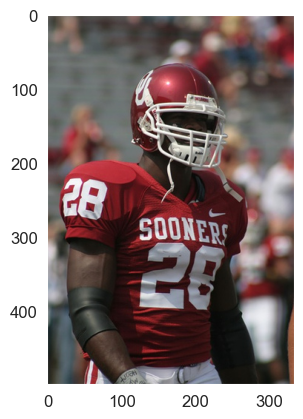

Referance Captions: 
A man be wear a Sooner red football shirt and helmet .
A Oklahoma Sooner football player wear his jersey number 28 .
A Sooner football player weas the number 28 and black armband .
Guy in red and white football uniform
The American footballer be wear a red and white strip .

Predicted Caption: 
Quarterback in white uniform be play football .

bleu score:  1.6954057018456463e-231


In [42]:
i=0
for img_id in test_features:
    i+=1
    img=cv2.imread(path_to_image+"/"+ img_id)
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    photo=test_features[img_id]
    plt.show()
    reference=[]
    for caps in test_captions[img_id]:
        list_caps=caps.split(" ")
        list_caps=list_caps[1:-1]
        reference.append(list_caps)
    candidate=greedy_search(photo)
    score = sentence_bleu(reference, candidate)
    print("Referance Captions: ")
    for cap in reference:
        print(" ".join(cap))
    print("\nPredicted Caption: ")
    print(" ".join(candidate))
    print("\nbleu score: ",score)
    if(i==5):
        break

## This Section is used to compares with Transformer model

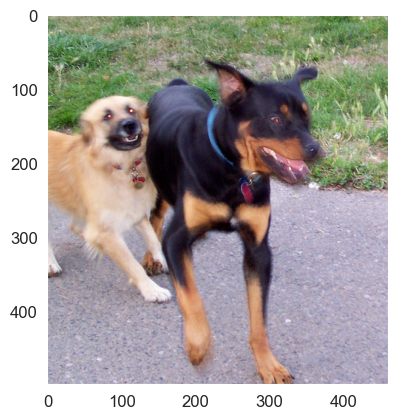

Referance Captions: 
A black and brown dog with a tan dog on a cement path in front of grass
A black dog and a yellow dog be walk on asphalt next to a field of grass .
A blurry photo of two dog .
a white dog be run behind a black dog on a paved path by some grass .
Two dog walk along a path beside the grass .
Predicted Caption: 
A black and white dog run in the grass .
bleu score:  0.21105340631872638


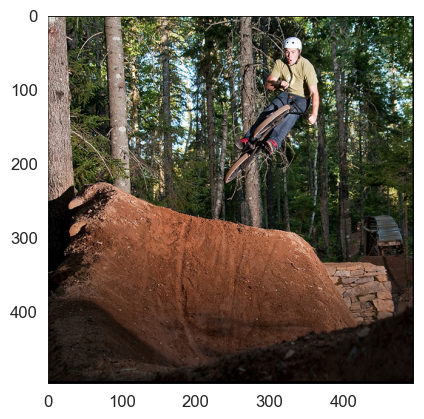

Referance Captions: 
A bicyclist fly through the air as he encounter a tree in his path .
A bicyclist be jump over a large object .
A man on a bike be jump off a dirt ramp .
A man wear a light brown shirt be ride a dirt bike in the wood .
A mountain biker be jump his bike over a tree stump in the wood .
Predicted Caption: 
A man climb a rock face .
bleu score:  0.062425357566781164


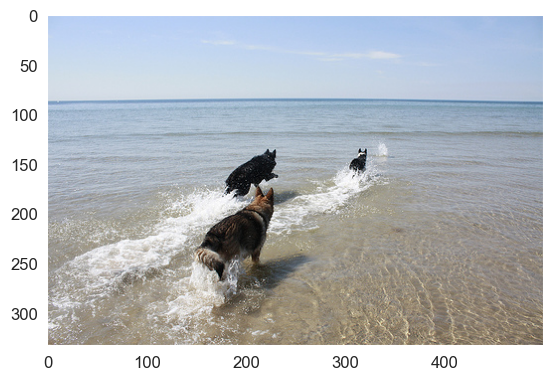

Referance Captions: 
Three dog be run in the water on a beach .
Three dog enter the ocean .
Three dog rush to chase a ball throw into the surf .
Three dog walk away on the water edge of the shore .
Three large dog be play in the water at a beach .
Predicted Caption: 
A doberman pincer play in the water .
bleu score:  0.3655552228545123


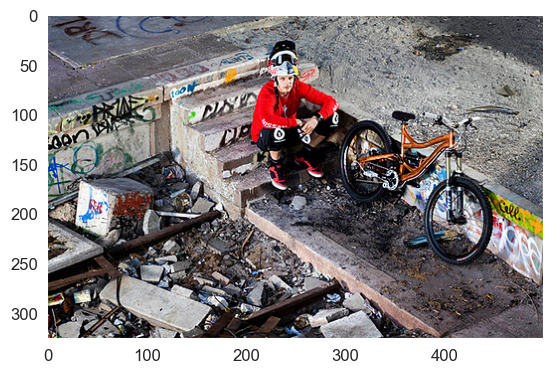

Referance Captions: 
A cyclist sit on some step with his bike .
A helmeted man sit on step with graffiti on them , and a bike nearby .
A man sit on the stair next to his bike .
A man with his bike amid a demolished building .
Man with a bike sit next to rubble .
Predicted Caption: 
A skateboarder perform a trick in the air .
bleu score:  0.03391326091030751


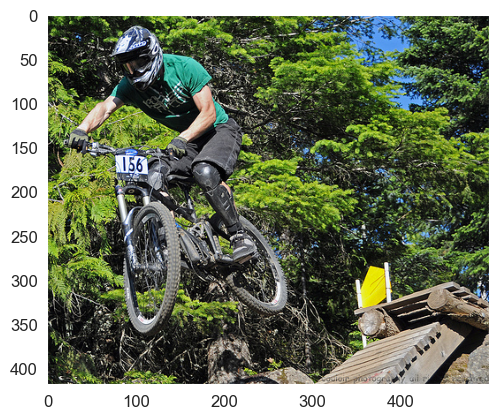

Referance Captions: 
a bicyclist wear a helment ride down a steep ramp
A bike rider catch air near a ramp .
A Bmx rider in midair .
A man wear a green shirt be jump his bicycle off a ramp .
Cyclist in green shirt do trick on wooden ramp
Predicted Caption: 
A man ride his bike on a dirt ramp .
bleu score:  0.07730551756939458


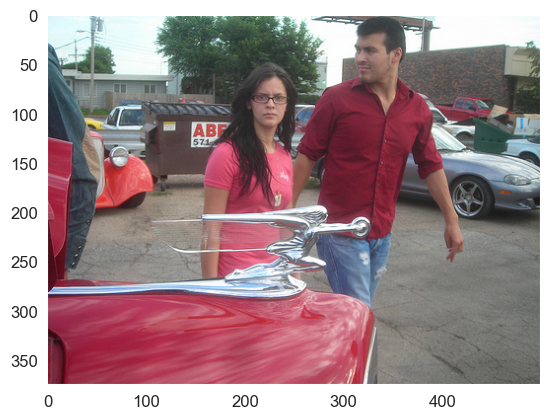

Referance Captions: 
A couple in a park lot .
A couple walk past a car in a park lot .
A man and a woman be walk past a car with a fancy symbol on the front .
A man and a woman walk past a red car with a silver hood ornament
A man and woman walk next to a red car with an unusual hood ornament .
Predicted Caption: 
A man in a blue coat and blue hat .
bleu score:  0.06320598870573935


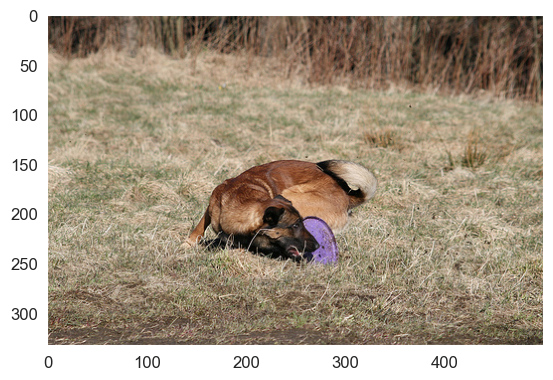

Referance Captions: 
A brown dog possessively grab a purple Frisbee in a field .
A brown dog run to catch a Frisbee in a field of grass .
A brown dog with a purple Frisbee in its mouth .
A dog in a field with a Frisbee .
A dog be concern with a purple object lie in an uncut field .
Predicted Caption: 
A dog roll through the grass .
bleu score:  0.07423667937500511


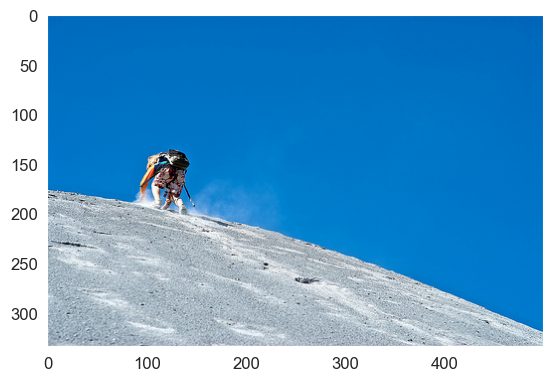

Referance Captions: 
A hiker ascend a snowy hill .
A man reach the top of a tall sand dune .
A person be hike to the top of a hill .
A person walk up a white sandy hill against the blue sky .
A person be wear short and climb a gray sand hill under a blue sky .
Predicted Caption: 
A man be climb a snowy mountain .
bleu score:  0.10573712634405641


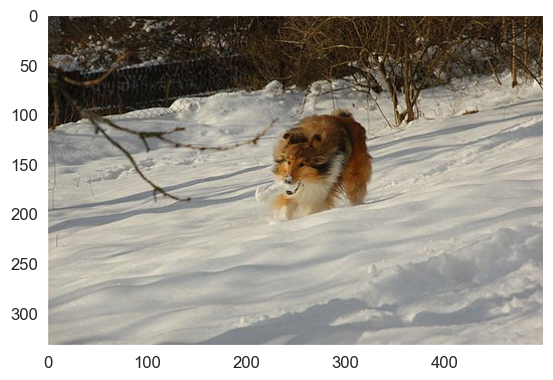

Referance Captions: 
A brown dog carry an object in its mouth on a snowy hillside .
A collie run through the snow .
A Sheltie dog carry a white-colored toy in its mouth as it walk across the snow .
Dog with a toy in the snow .
A dog wade through deep snow with something in its mouth .
Predicted Caption: 
A brown dog be run through the snow .
bleu score:  0.5969491792019646


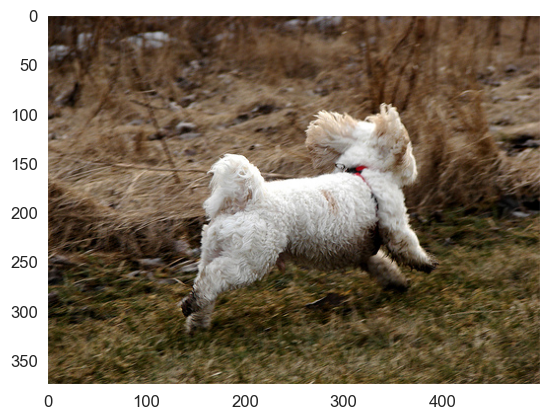

Referance Captions: 
A fluffy white dog run through the wood with his ear flap in a breeze .
A small white dog be run across a grassy field .
A white dog run in the grass ,
A white dog wear a red harness run through the wood .
A little white dog wear the red collar be run in the grass .
Predicted Caption: 
A white dog play with a ball in the sand .
bleu score:  0.13193849171325928
Average BLEU Score of 10  pics is =  0.17223202305597468


In [43]:
from nltk.translate.bleu_score import sentence_bleu
from nltk.translate.bleu_score import SmoothingFunction

select_pics = [
        '3651971126_309e6a5e22.jpg',
        '3640422448_a0f42e4559.jpg',
        '3630641436_8f9ac5b9b2.jpg',
        '3613424631_3ae537624f.jpg',
        '3696698390_989f1488e7.jpg',
        '3725202807_12fbfdd207.jpg',
        '430173345_86388d8822.jpg',
        '3745451546_fc8ec70cbd.jpg',
        '384577800_fc325af410.jpg',
        '416106657_cab2a107a5.jpg'
    ]



i=0
bleu_scores = []
for img_id in select_pics:
    i+=1
    img=cv2.imread(path_to_image+ "/" + img_id)
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    photo=test_features[img_id]
    plt.show()
    reference=[]
    for caps in test_captions[img_id]:
        list_caps=caps.split(" ")
        list_caps=list_caps[1:-1]
        reference.append(list_caps)
    candidate=beam_search(photo,3)
    
    # Calculate BLEU score
    chencherry = SmoothingFunction()
    score = sentence_bleu(reference, candidate, smoothing_function=chencherry.method1)
    bleu_scores.append(score)
    
    print("Referance Captions: ")
    for cap in reference:
        print(" ".join(cap))
    print("Predicted Caption: ")
    print(" ".join(candidate))
    print("bleu score: ",score)
    
# Compute average BLEU score
if bleu_scores:
    average_bleu = sum(bleu_scores) / len(bleu_scores)
else:
    average_bleu = 0

print("Average BLEU Score of",i," pics is = ",average_bleu)